Link do notatnika: https://colab.research.google.com/drive/1ZuBTU5dqvMEuK69xqNeiZnGKCptcJKz3?usp=sharing

---



<h1>ZMGSN Lista 4. - Sieci syjamskie</h1>

<h2>Opis zadania</h2>

W ramach zadania należy:
<ol>
<li>Zapoznać się z poniższym eksperymentem z wykorzystaniem sieci dwójkowej</li>
<li>Dokonać analizy wpływu hiperparametrów eksperymentu, np. kroku uczenia, rozmiaru pakietu (ang. <i>batch size</i>), liczby epok na wyniki sieci dwójkowej</li>(10pkt)
<li>Dokonać modyfikacji sieci dwójkowej w celu zbadania wpływu architektury na wyniki</li>(10pkt)
<li>Na podstawie implementacji sieci dwójkowej zaimplementować sieć trójkową. Należy zaimplementować klasę obsługującą zbiór danych, strukturę samej sieci oraz zmodyfikowaną wersję funkcji straty.</li> (30pkt)
<li>Dokonać ewaluacji opracowanej sieci trójkowej zgodnie z punktami 2. i 3.</li>(20pkt)
<li>Porównać jakość działania sieci dwójkowej z jakością działania sieci trójkowej</li>(15pkt)
<li>Opracować procedurę ewaluacji jakości działania sieci dwójkowej i sieci trójkowej, uwzględniającą różne metody wizualizacji (np. wykresy, miary, klasy), klasteryzacji, redukcji wymiarów (np. t-SNE)</li>(15pkt)
</ol>

Ocenie podlegać będzie jakość wykonania zadania, w tym:
<ol>
<li>Właściwe wykonanie zadań</li>
<li>Rzetelne opracowanie wyników, uwzględniające analizę jakościową i ilościową</li>
<li>Opracowanie wniosków mających na celu wyjaśnienie badanych zjawisk i uzyskanych wyników</li>
<li>Opracowanie i wyjaśnienie kodu źródłowego</li>
</ol>


<h2>Import używanych bibliotek</h2>

In [ ]:
import random
import PIL.ImageOps

from PIL import Image

import matplotlib.pyplot as plt
import numpy as np
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.autograd import Variable
from torch import optim
from torch.utils.data import DataLoader, Dataset
from tqdm.notebook import tqdm
import pandas as pd
import plotly.express as px

<h2>Konfiguracja wyświetlania wizualizacji w bibiliotece Matploltib</h2>

In [ ]:
%matplotlib inline

<h2>Inicjalizacja ziarna generatora liczb pseudolosowych</h2>

In [ ]:
torch.manual_seed(0)

<h2>Określenie domyślnego urządzenia na podstawie sprawdzenia dostępności karty graficznej</h2>

In [ ]:
device = torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda:0")
print("Using device", device)

Using device cuda:0


<h2>Pobranie i rozpakowanie zbioru danych</h2>

In [ ]:
!wget https://github.com/maticvl/dataHacker/raw/master/DATA/at%26t.zip
!rm -rf data
!unzip "at&t.zip" -d .

--2023-12-13 16:40:12--  https://github.com/maticvl/dataHacker/raw/master/DATA/at%26t.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/maticvl/dataHacker/master/DATA/at%26t.zip [following]
--2023-12-13 16:40:13--  https://raw.githubusercontent.com/maticvl/dataHacker/master/DATA/at%26t.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3797060 (3.6M) [application/zip]
Saving to: ‘at&t.zip’

at&t.zip            100%[===================>]   3.62M  --.-KB/s    in 0.01s   

2023-12-13 16:40:13 (268 MB/s) - ‘at&t.zip’ saved [3797060/3797060]

Archive:  at&t.zip
   creating: ./data/
   creating

<h2>Funkcje pomocnicze służące do wyświetlania próbek ze zbioru oraz generowania wykresów</h2>

In [ ]:
def imshow(img, text=None):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})

    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def show_plot(iteration,loss):
    plt.plot(iteration,loss)
    plt.show()

<h2>Deklaracja klasy obsługującej pobrany zbiór danych</h2>

#Sieć dwójkowa

In [ ]:
class SiameseNetworkDataset(Dataset):
    def __init__(self,imageFolderDataset,transform=None):
        self.imageFolderDataset = imageFolderDataset
        self.transform = transform

    def __getitem__(self,index):
        img0_tuple = random.choice(self.imageFolderDataset.imgs)

        # Potrzebujemy mniej więcej połowę par podobnych obrazków
        should_get_same_class = random.randint(0,1)
        if should_get_same_class:
            while True:
                # Wyszukiwanie zdjęcia tej samej osoby
                img1_tuple = random.choice(self.imageFolderDataset.imgs)
                if img0_tuple[1] == img1_tuple[1]:
                    break
        else:

            while True:
                # Wyszukiwanie zdjęcia innej  osoby
                img1_tuple = random.choice(self.imageFolderDataset.imgs)
                if img0_tuple[1] != img1_tuple[1]:
                    break

        img0 = Image.open(img0_tuple[0])
        img1 = Image.open(img1_tuple[0])

        img0 = img0.convert("L")
        img1 = img1.convert("L")

        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)

        return img0, img1, torch.from_numpy(np.array([int(img1_tuple[1] != img0_tuple[1])], dtype=np.float32))

    def __len__(self):
        return len(self.imageFolderDataset.imgs)

<h2>Wczytanie i wstępne przetwarzanie zbioru danych</h2>

In [ ]:
# Wczytanie zbioru danych
folder_dataset = datasets.ImageFolder(root="./data/faces/training/")

# Zmiana rozmiaru próbek i konwersja na tensor
transformation = transforms.Compose([transforms.Resize((100,100)),
                                     transforms.ToTensor()
                                    ])

# Inicjalizacja klasy obsługującej zbiór danych
siamese_dataset = SiameseNetworkDataset(imageFolderDataset=folder_dataset,
                                        transform=transformation)

<h2>Przykładowy podgląd próbek ze zbioru danych</h2>

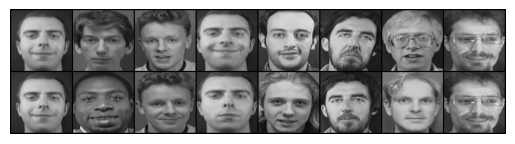

[0. 1. 0. 0. 1. 0. 1. 0.]


In [ ]:
# Inicjalizacja klasy obsługującej zbiór danych
vis_dataloader = DataLoader(siamese_dataset,
                        shuffle=True,
                        num_workers=2,
                        batch_size=8)

# Ekstrakcja pierwszego pakietu danych
example_batch = next(iter(vis_dataloader))

# Pojedynczy pakiet danych zawiera tablicę zdjęć o rozmiarze 2 x 8 oraz etykietę
# Jeżeli etykieta jest równa 1 oznacza to, że para zdjęć nie przedstawia tej samej osoby.
# Jeżeli etykieta jest równa 0 oznacza to, że para zdjęć przedstawia tę samą osobę
concatenated = torch.cat((example_batch[0], example_batch[1]),0)

imshow(torchvision.utils.make_grid(concatenated))
print(example_batch[2].numpy().reshape(-1))

<h2>Deklaracja podstawowej klasy modelu sieci dwójkowej<h2>

In [ ]:
class SiameseNetwork(nn.Module):

    def __init__(self):
        super(SiameseNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11,stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),

            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, stride=2),

            nn.Conv2d(256, 384, kernel_size=3,stride=1),
            nn.ReLU(inplace=True)
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 1024),
            nn.ReLU(inplace=True),

            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),

            nn.Linear(256,2)
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        # Funkcja przyjmuje obie próbki i zwraca parę wektorów
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)

        return output1, output2

<h2>Definicja klasy reprezentującej kontrastową funkcję straty</h2>

In [ ]:
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
      euclidean_distance = F.pairwise_distance(output1, output2, keepdim = True)

      loss_contrastive = torch.mean((1-label) * torch.pow(euclidean_distance, 2) +
                                    (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))

      return loss_contrastive


<h2></h2>

<h2>Wczytanie zbioru uczącego</h2>

In [ ]:
train_dataloader = DataLoader(siamese_dataset,
                        shuffle=True,
                        num_workers=8,
                        batch_size=128)

<h2>Przykładowa pętla ucząca</h2>

In [ ]:
def train(lr, epochs):
    optimizer = optim.Adam(net.parameters(), lr = lr)

    counter = []
    loss_history = []
    iteration_number= 0
    loss_after_epoch = []

    # Iteracja po epokach
    for epoch in tqdm(range(epochs)):

        # iteracja po pakietach
        for i, (img0, img1, label) in enumerate(train_dataloader, 0):

            # Przeniesienie obrazów i etykiet do pamięci karty graficznej
            img0, img1, label = img0.to(device), img1.to(device), label.to(device)

            # Ustawienie wartości gradientów na zero
            optimizer.zero_grad()

            # Przepuszczenie dwóch obrazów przez sieć i uzyskanie dwóch wektorów wyjściowych
            output1, output2 = net(img0, img1)

            # Obliczenie wartości funkcji straty na podstawie wektorów wyjściowych
            loss_contrastive = criterion(output1, output2, label)

            # Obliczenie zmian wag w oparciu o wartość funkcji straty
            loss_contrastive.backward()

            # Aktualizacja wag sieci
            optimizer.step()

            # Wyświetlenie wartości funkcji straty co 10 pakietów
            if i % 10 == 0 :
                # print(f"Epoch number {epoch}\n Current loss {loss_contrastive.item()}\n")
                iteration_number += 10

                counter.append(iteration_number)
                loss_history.append(loss_contrastive.item())

        loss_after_epoch.append(loss_contrastive.item())

    # show_plot(counter, loss_history)
    return loss_after_epoch

<h2>Przykładowa funkcja służąca do ewaluacji sieci dwójkowej</h2>

In [ ]:
# Określenie ścieżki do katalogu ze zbiorem testowym i wczytanie go do obiektu klasy Dataloader
folder_dataset_test = datasets.ImageFolder(root="./data/faces/testing/")
siamese_dataset = SiameseNetworkDataset(imageFolderDataset=folder_dataset_test,
                                        transform=transformation)
test_dataloader = DataLoader(siamese_dataset, num_workers=2, batch_size=1, shuffle=True)

# Uzyskanie obrazu do przeprowadzenia ewaluacji
dataiter = iter(test_dataloader)
x0, _, _ = next(dataiter)

#Sieć trójkowa

In [ ]:
class TripletSiameseNetworkDataset(Dataset):
    def __init__(self,imageFolderDataset,transform=None):
        self.imageFolderDataset = imageFolderDataset
        self.transform = transform

    def __getitem__(self,index):
        img0_tuple = random.choice(self.imageFolderDataset.imgs)

        while True:
            # Wyszukiwanie zdjęcia tej samej osoby
            pos_tuple = random.choice(self.imageFolderDataset.imgs)
            if img0_tuple[1] == pos_tuple[1]:
                break

        while True:
            # Wyszukiwanie zdjęcia innej osoby
            neg_tuple = random.choice(self.imageFolderDataset.imgs)
            if img0_tuple[1] != neg_tuple[1]:
                break

        img_base = Image.open(img0_tuple[0])
        img_neg = Image.open(neg_tuple[0])
        img_pos = Image.open(pos_tuple[0])

        img0 = img_base.convert("L")
        img1 = img_neg.convert("L")
        img2 = img_pos.convert("L")

        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)
            img2 = self.transform(img2)

        return img0, img2, img1

    def __len__(self):
        return len(self.imageFolderDataset.imgs)

In [ ]:
# Wczytanie zbioru danych
folder_dataset = datasets.ImageFolder(root="./data/faces/training/")

# Zmiana rozmiaru próbek i konwersja na tensor
transformation = transforms.Compose([transforms.Resize((100,100)),
                                     transforms.ToTensor()
                                    ])

# Inicjalizacja klasy obsługującej zbiór danych
triplet_siamese_dataset = TripletSiameseNetworkDataset(imageFolderDataset=folder_dataset,
                                        transform=transformation)

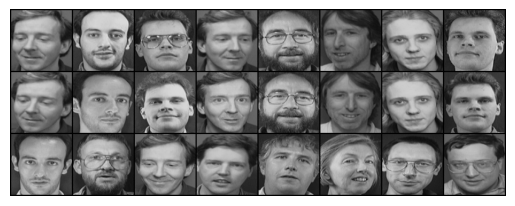

In [ ]:
# Inicjalizacja klasy obsługującej zbiór danych
vis_dataloader = DataLoader(triplet_siamese_dataset,
                        shuffle=True,
                        num_workers=2,
                        batch_size=8)

# Ekstrakcja pierwszego pakietu danych
example_batch = next(iter(vis_dataloader))

concatenated = torch.cat((example_batch[0], example_batch[1], example_batch[2]), 0)

imshow(torchvision.utils.make_grid(concatenated))

In [ ]:
class TripletSiameseNetwork(nn.Module):

    def __init__(self):
        super(TripletSiameseNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11,stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),

            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, stride=2),

            nn.Conv2d(256, 384, kernel_size=3,stride=1),
            nn.ReLU(inplace=True)
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 1024),
            nn.ReLU(inplace=True),

            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),

            nn.Linear(256,2)
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2, input3):
        # Funkcja przyjmuje 3 próbki i zwraca 3 wektory
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        output3 = self.forward_once(input3)

        return output1, output2, output3

In [ ]:
class TripletContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(TripletContrastiveLoss, self).__init__()
        self.margin = margin


    def forward(self, anchor, positive, negative):
        distance_positive = F.pairwise_distance(anchor, positive, keepdim=True)
        distance_negative = F.pairwise_distance(anchor, negative, keepdim=True)

        loss_triplet = torch.mean(torch.relu(distance_positive - distance_negative + self.margin))

        return loss_triplet


In [ ]:
train_dataloader = DataLoader(triplet_siamese_dataset,
                        shuffle=True,
                        num_workers=8,
                        batch_size=128)

In [ ]:
def train(lr, epochs):
    optimizer = optim.Adam(net.parameters(), lr = lr)

    counter = []
    loss_history = []
    iteration_number= 0
    loss_after_epoch = []

    # Iteracja po epokach
    for epoch in tqdm(range(epochs)):

        # iteracja po pakietach
        for i, (img0, img1, img2) in enumerate(train_dataloader, 0):

            # Przeniesienie obrazów i etykiet do pamięci karty graficznej
            img0, img1, img2 = img0.to(device), img1.to(device), img2.to(device)

            # Ustawienie wartości gradientów na zero
            optimizer.zero_grad()

            # Przepuszczenie dwóch obrazów przez sieć i uzyskanie dwóch wektorów wyjściowych
            output1, output_pos, output_neg = net(img0, img1, img2)

            # Obliczenie wartości funkcji straty na podstawie wektorów wyjściowych
            loss_contrastive = criterion(output1, output_pos, output_neg)

            # Obliczenie zmian wag w oparciu o wartość funkcji straty
            loss_contrastive.backward()

            # Aktualizacja wag sieci
            optimizer.step()

            # Wyświetlenie wartości funkcji straty co 10 pakietów
            if i % 10 == 0 :
                # print(f"Epoch number {epoch}\n Current loss {loss_contrastive.item()}\n")
                iteration_number += 10

                counter.append(iteration_number)
                loss_history.append(loss_contrastive.item())

    # show_plot(counter, loss_history)
        loss_after_epoch.append(loss_contrastive.item())

    # show_plot(counter, loss_history)
    return loss_after_epoch

In [ ]:
# Określenie ścieżki do katalogu ze zbiorem testowym i wczytanie go do obiektu klasy Dataloader
folder_dataset_test = datasets.ImageFolder(root="./data/faces/testing/")
triplet_siamese_dataset = TripletSiameseNetworkDataset(imageFolderDataset=folder_dataset_test,
                                        transform=transformation)
test_dataloader = DataLoader(triplet_siamese_dataset, num_workers=2, batch_size=1, shuffle=True)

# Uzyskanie obrazu do przeprowadzenia ewaluacji
dataiter = iter(test_dataloader)
x0, _, _ = next(dataiter)

#Eksperymenty

In [ ]:
examples_data = []

for i in range(7):
    _, x1, label2 = next(dataiter)

    example_data = {
        'x1': x1.clone(),
        'label2': label2.clone()
    }
    examples_data.append(example_data)

## Learning rate

### Lr=0.0005

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

loss_lr_0005 = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

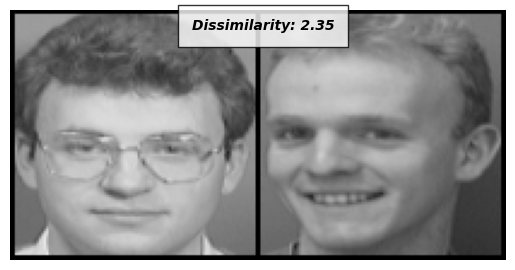

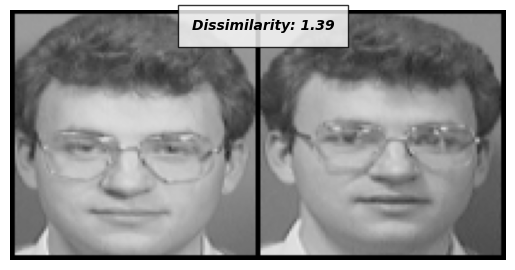

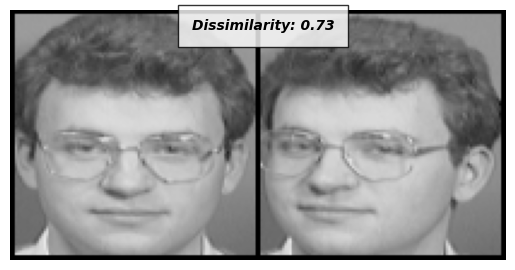

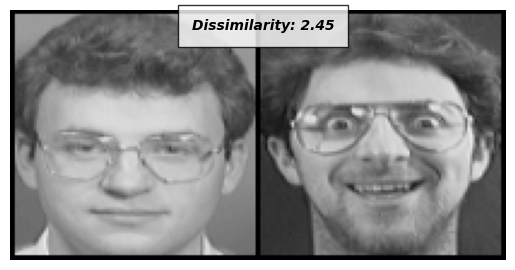

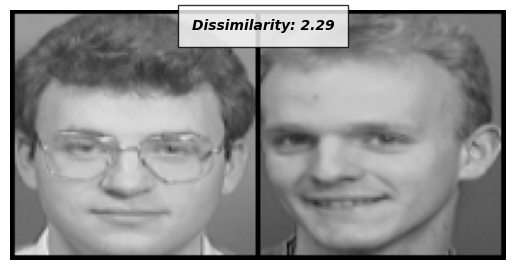

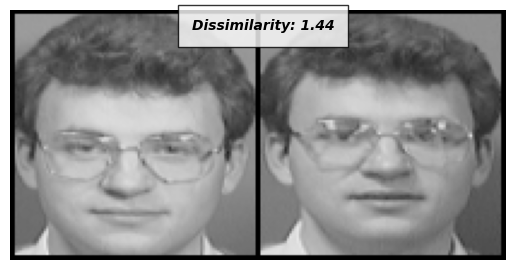

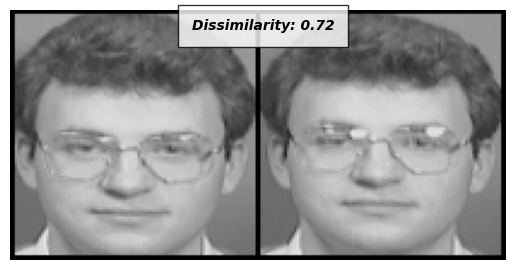

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

### Lr=0.005

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

loss_lr_005 = train(0.005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

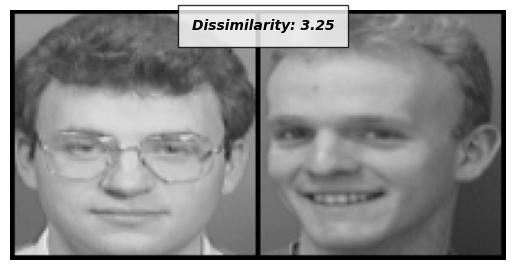

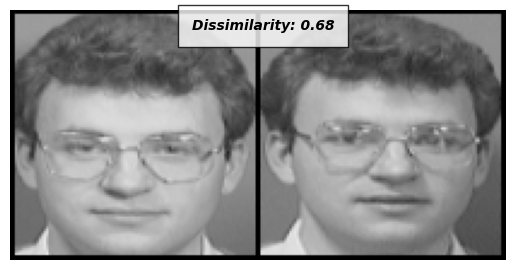

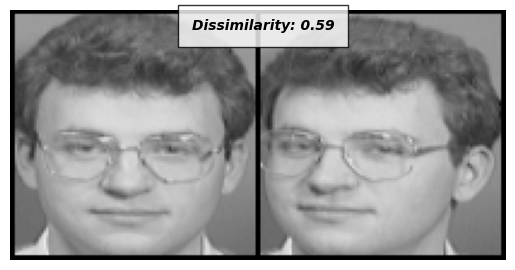

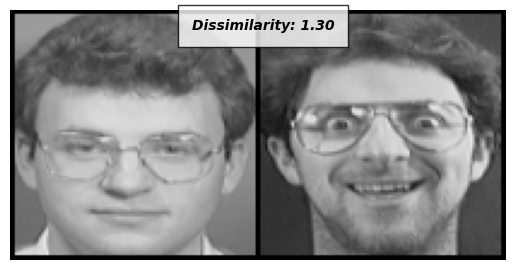

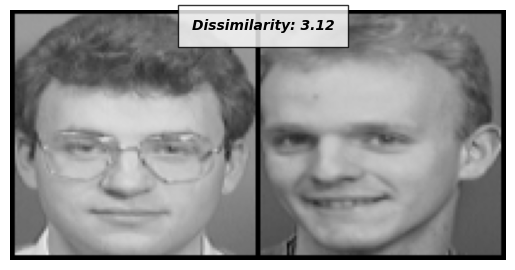

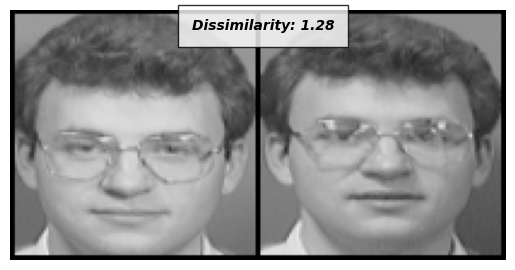

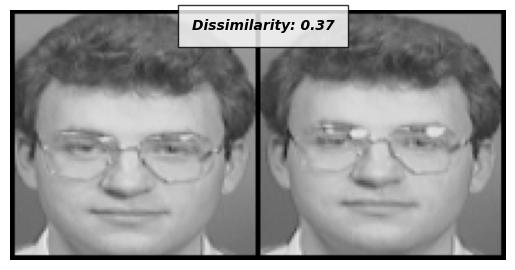

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

### Lr=0.00005

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

loss_lr_00005 = train(0.00005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

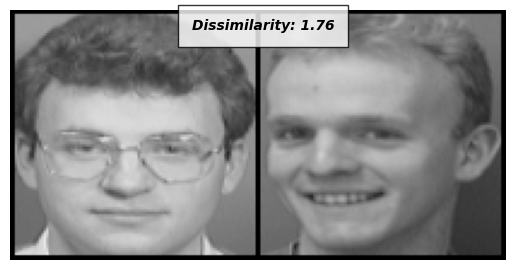

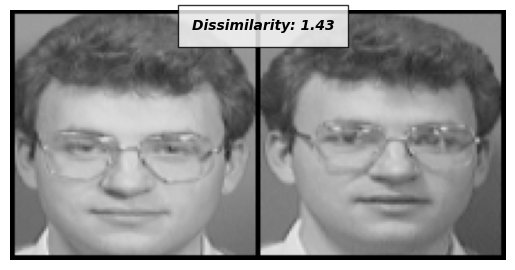

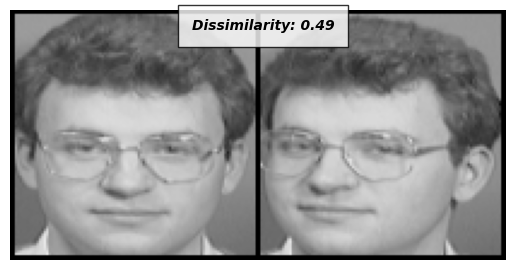

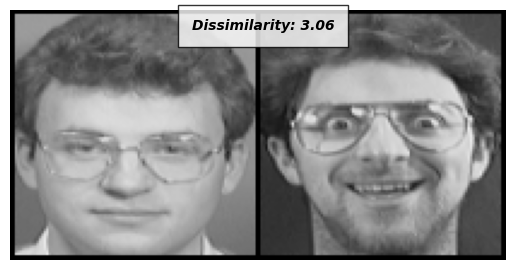

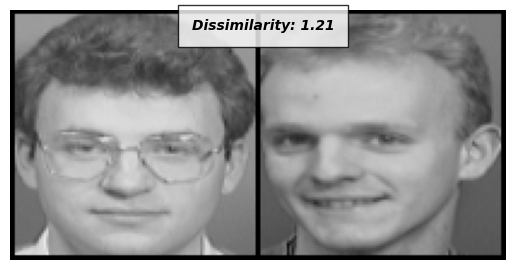

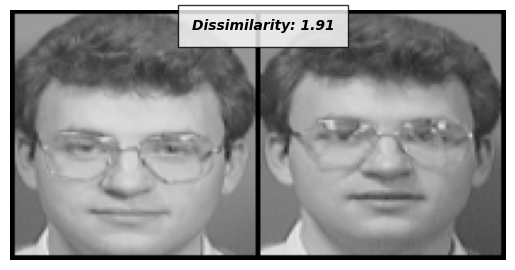

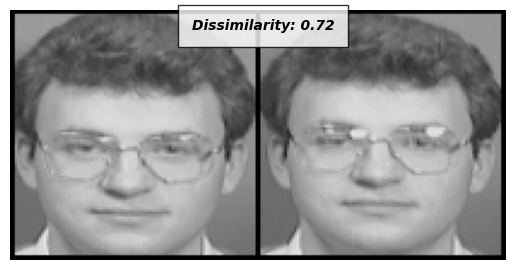

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

In [ ]:
y_values = {
    '0.005': loss_lr_005,
    '0.0005': loss_lr_0005,
    '0.00005': loss_lr_00005
}
df = pd.DataFrame(y_values)

fig = px.line(df, labels={'value': 'Loss', 'index': 'Epoch'},
              title='Learning rates', width=1000)

fig.show()

## Epochs

### Epochs=50

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

ep = train(0.0005, 50)

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning:

This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



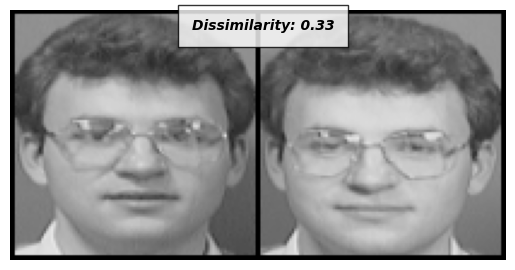

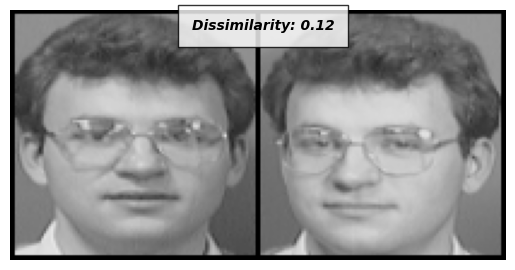

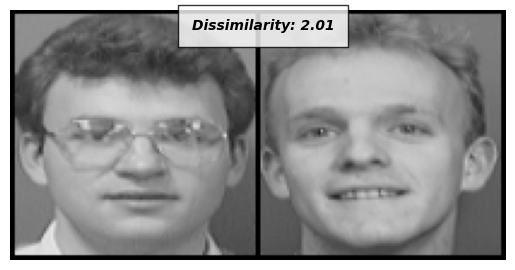

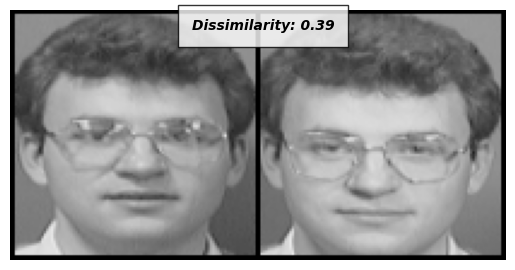

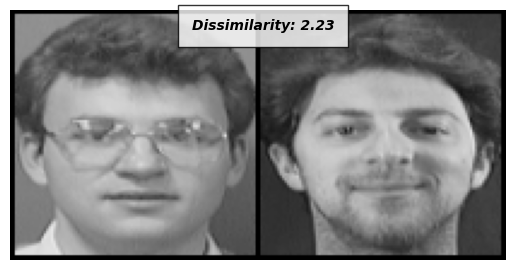

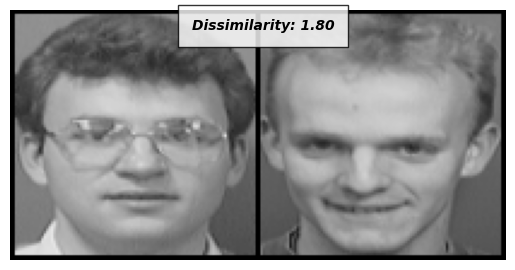

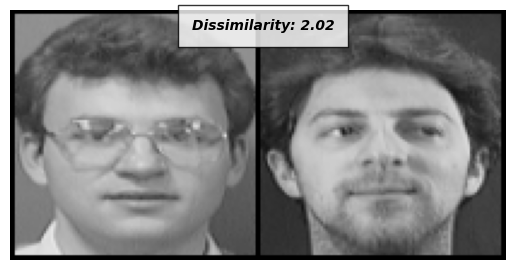

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

### Epochs=100

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

[1.4655197858810425,
 1.4594173431396484,
 1.695004940032959,
 2.423051595687866,
 2.1358070373535156,
 1.6716700792312622,
 1.9817901849746704,
 0.7225072979927063,
 0.6015285849571228,
 0.2736075818538666,
 0.34231796860694885,
 0.4222806394100189,
 0.2129250019788742,
 0.24316532909870148,
 0.49063995480537415,
 0.11656425148248672,
 0.25952303409576416,
 0.2390226125717163,
 0.3541468679904938,
 0.3277251422405243,
 0.408570796251297,
 0.13521645963191986,
 0.33279725909233093,
 0.2103160321712494,
 0.19012345373630524,
 0.210397407412529,
 0.1930720955133438,
 0.13103212416172028,
 0.09248474985361099,
 0.187774196267128,
 0.12673158943653107,
 0.15345607697963715,
 0.14677290618419647,
 0.12547777593135834,
 0.10520210862159729,
 0.08084381371736526,
 0.11852242052555084,
 0.2634575366973877,
 0.16750235855579376,
 0.20500563085079193,
 0.10747884958982468,
 0.1641981154680252,
 0.13505515456199646,
 0.0769767314195633,
 0.20544439554214478,
 0.10426133126020432,
 0.1195510104298

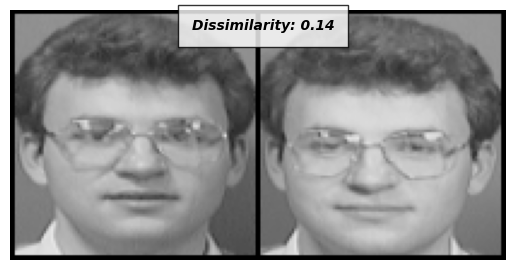

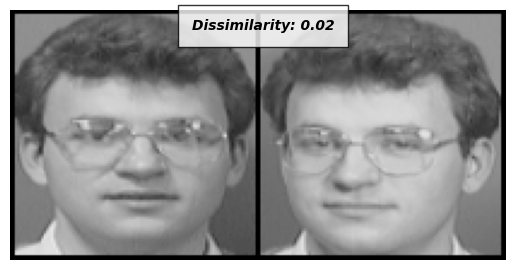

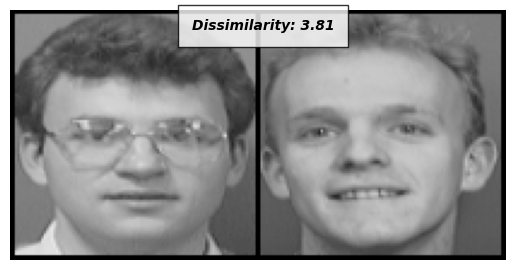

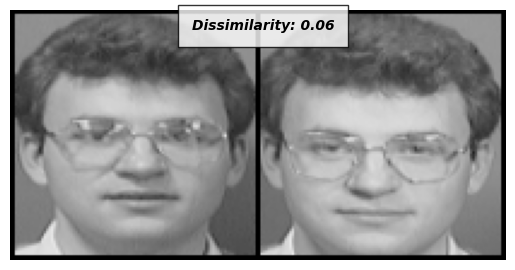

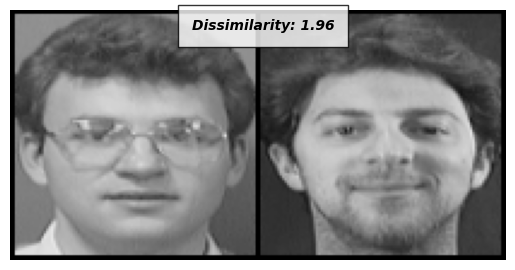

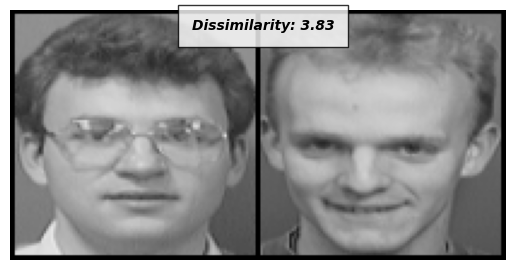

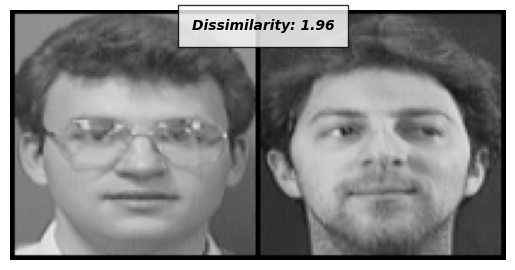

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

### Epochs=150

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

train(0.0005, 150)

  0%|          | 0/150 [00:00<?, ?it/s]

[1.5984606742858887,
 2.383918046951294,
 2.3475968837738037,
 1.769565224647522,
 1.5710653066635132,
 1.2975362539291382,
 1.670332908630371,
 1.3616687059402466,
 0.6273046731948853,
 0.5062402486801147,
 0.2518240511417389,
 0.2744706869125366,
 0.2413833737373352,
 0.2539392113685608,
 0.2348509579896927,
 0.3249625563621521,
 0.440443754196167,
 0.1892334669828415,
 0.22851096093654633,
 0.16385091841220856,
 0.14227941632270813,
 0.1993446797132492,
 0.2311634123325348,
 0.15320487320423126,
 0.1193026527762413,
 0.1836801916360855,
 0.17921680212020874,
 0.20715031027793884,
 0.08508159965276718,
 0.24603654444217682,
 0.560613751411438,
 0.17069168388843536,
 0.15335260331630707,
 0.3116990029811859,
 0.2774021625518799,
 0.1274327039718628,
 0.06349316239356995,
 0.048771947622299194,
 0.08055160194635391,
 0.0791148692369461,
 0.08405939489603043,
 0.13739226758480072,
 0.053704775869846344,
 0.32403552532196045,
 0.06852668523788452,
 0.16908802092075348,
 0.075517572462558

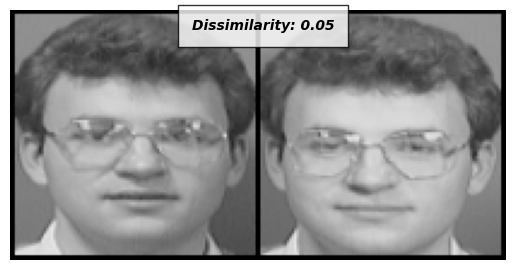

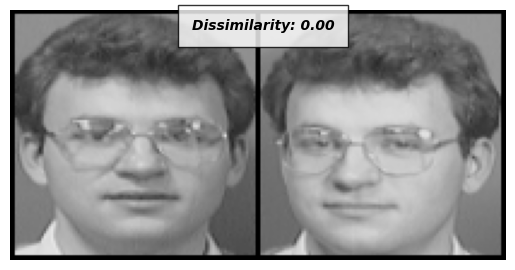

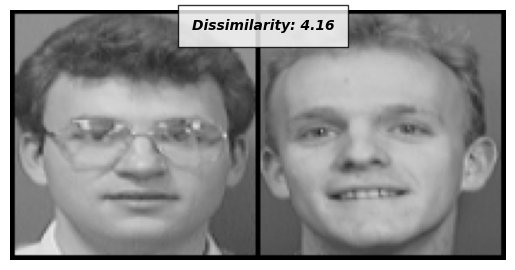

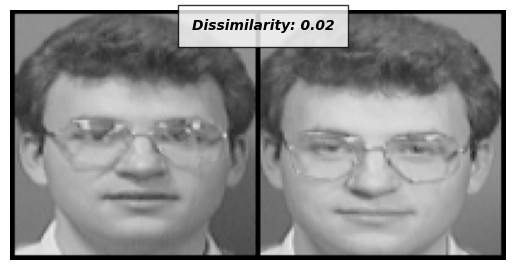

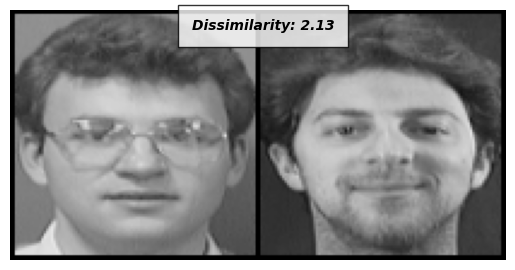

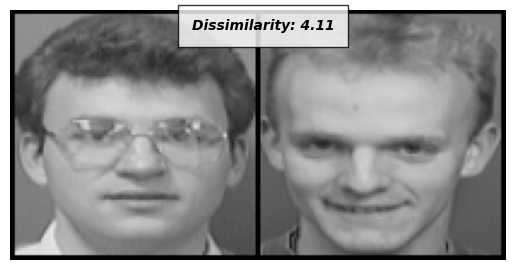

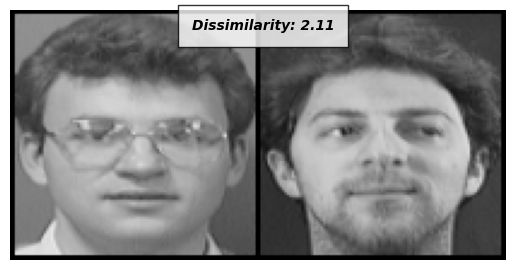

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

## Batch size

### Batch_s=32

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

loss_bs_32 = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

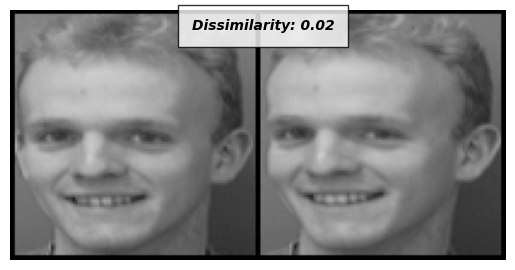

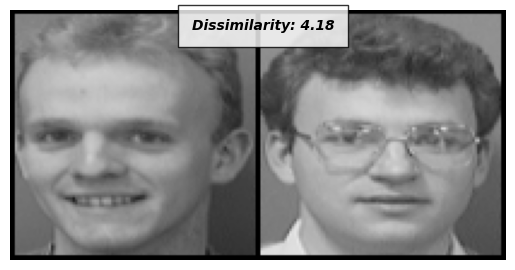

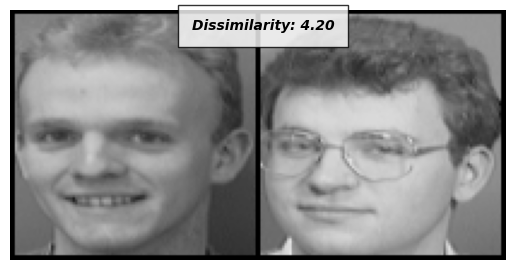

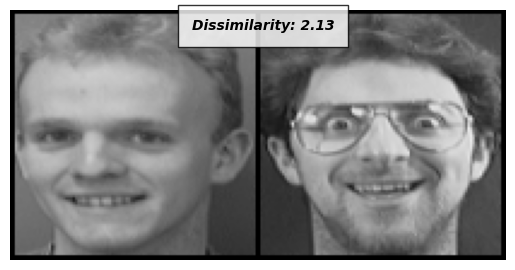

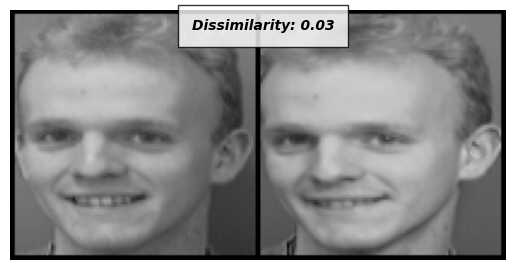

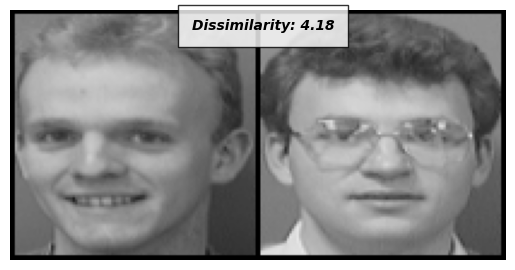

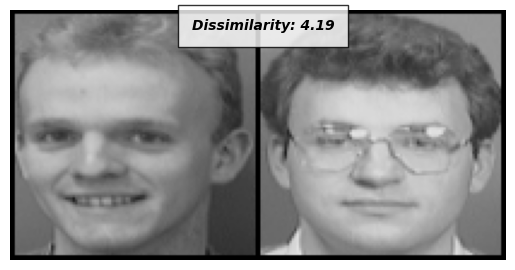

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

### Batch_s=64

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

loss_bs_64 = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

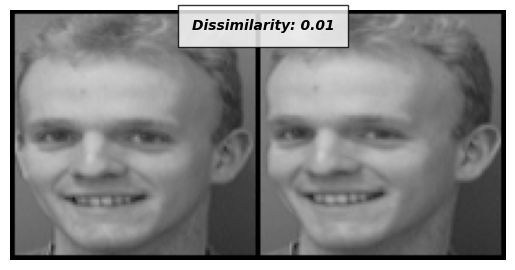

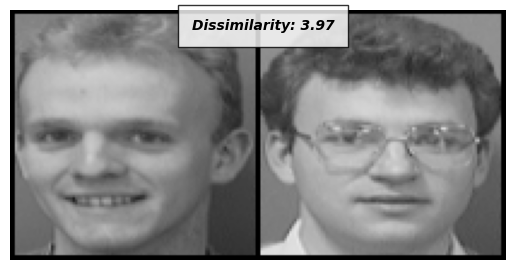

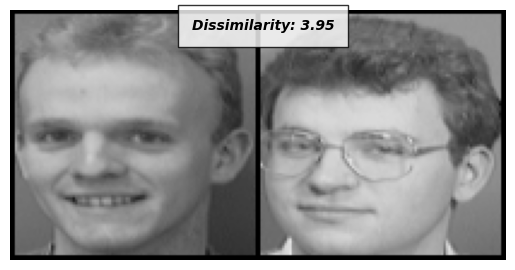

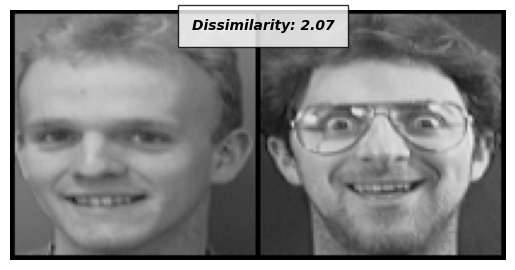

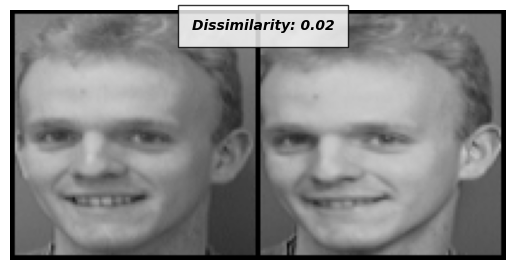

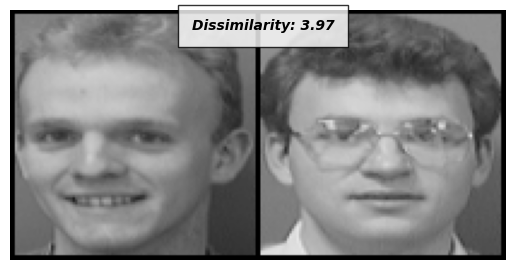

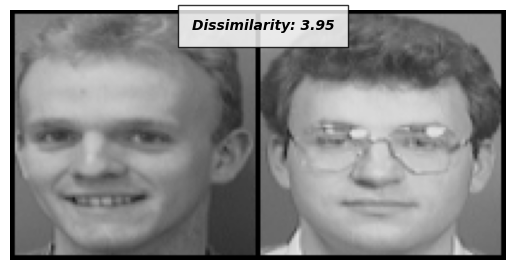

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

### Batch_s=128

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

loss_bs_128 = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

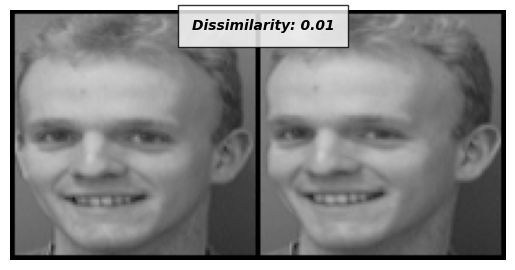

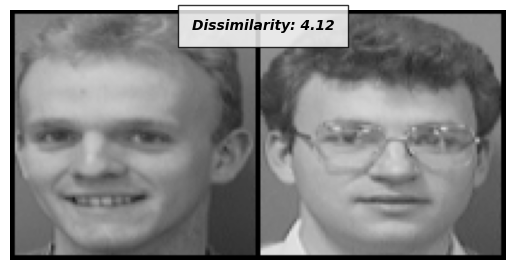

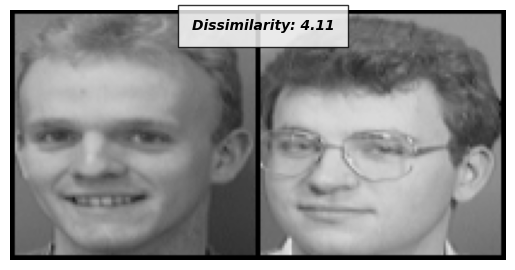

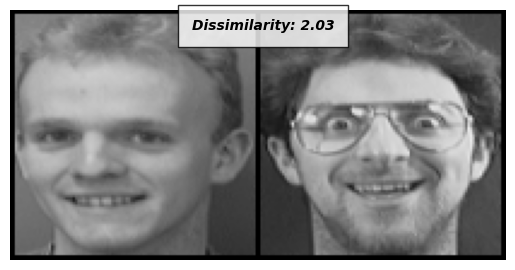

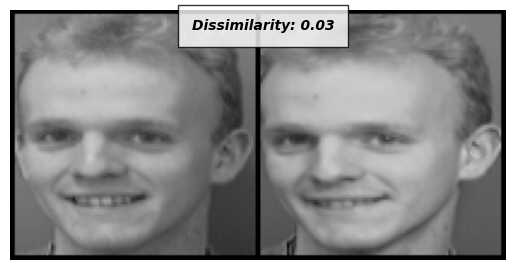

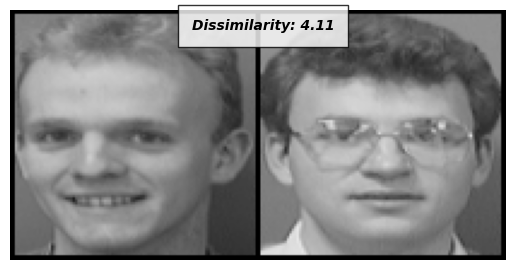

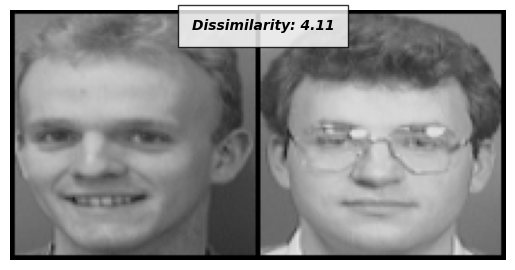

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

In [ ]:
y_values = {
    '32': loss_bs_32,
    '64': loss_bs_64,
    '128': loss_bs_128
}
df = pd.DataFrame(y_values)

fig = px.line(df, labels={'value': 'Loss', 'index': 'Epoch'},
              title='Batch Sizes', width=1000)

fig.show()

##Inne architektury

### AvgPool

In [ ]:
def calculate_normal(input, kernel, stride, padding):
  return 1+ (input + 2*padding - (kernel-1) - 1)/stride

calculate_normal(100,11,4,0)

23.25

In [ ]:
class SiameseNetwork(nn.Module):

    def __init__(self):
        super(SiameseNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11,stride=4),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(3, stride=2),

            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(2, stride=2),

            nn.Conv2d(256, 384, kernel_size=3,stride=1),
            nn.ReLU(inplace=True)
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 1024),
            nn.ReLU(inplace=True),

            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),

            nn.Linear(256,2)
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        # Funkcja przyjmuje obie próbki i zwraca parę wektorów
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)

        return output1, output2

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

loss_avgpool = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning:

This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



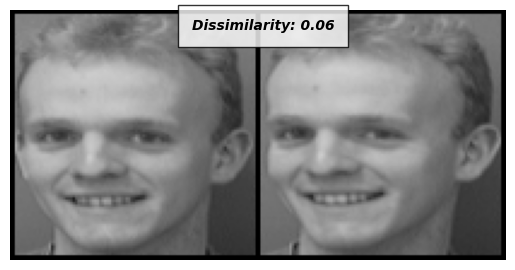

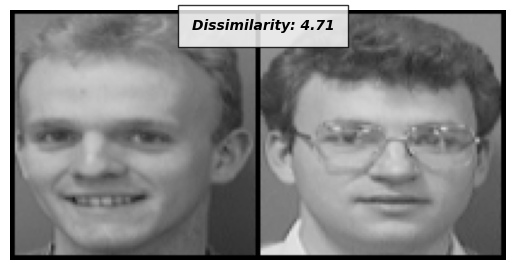

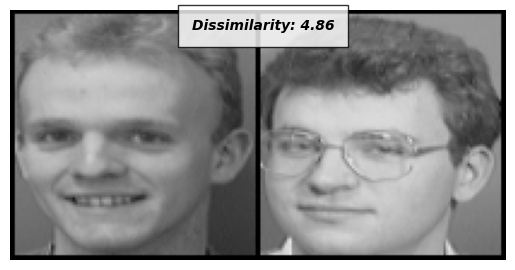

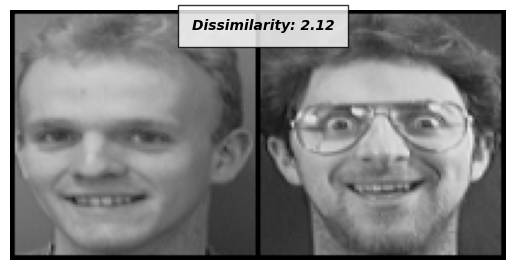

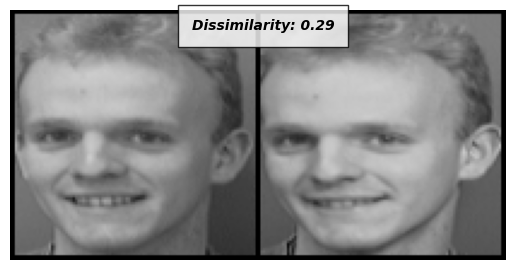

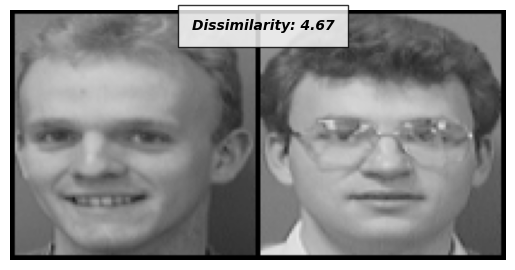

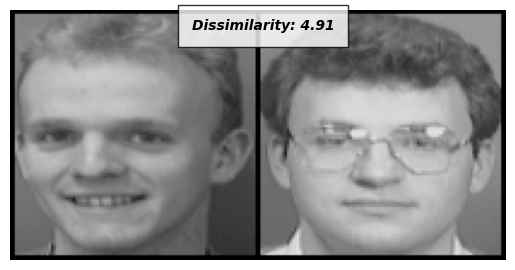

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

### Bigger

In [ ]:
def calculate_normal(input, kernel, stride, padding):
  return 1+ (input + 2*padding - (kernel-1) - 1)/stride

calculate_normal(100,3,1,1)

100.0

In [ ]:
class SiameseNetwork(nn.Module):

    def __init__(self):
        super(SiameseNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11,stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),

            nn.Conv2d(96, 96, kernel_size=3,stride=1,padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, stride=2),

            nn.Conv2d(256, 384, kernel_size=3,stride=1),
            nn.ReLU(inplace=True)
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 1024),
            nn.ReLU(inplace=True),

            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),

            nn.Linear(256,2)
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        # Funkcja przyjmuje obie próbki i zwraca parę wektorów
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)

        return output1, output2

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

loss_big = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

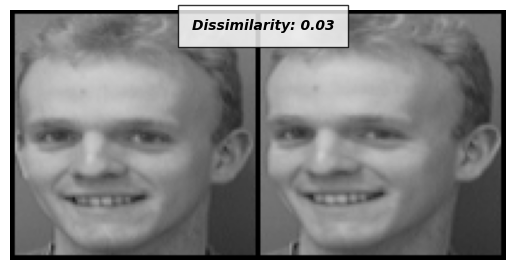

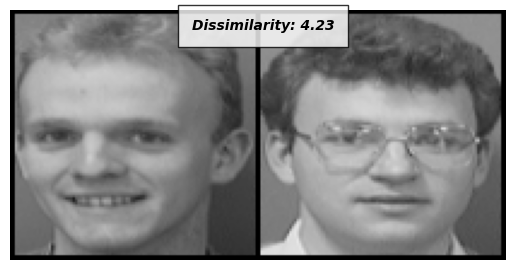

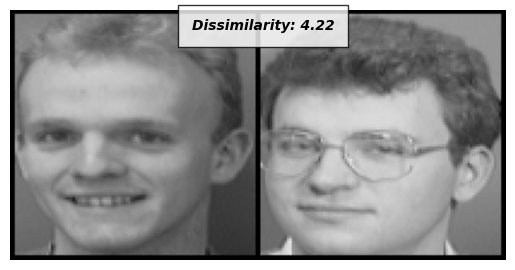

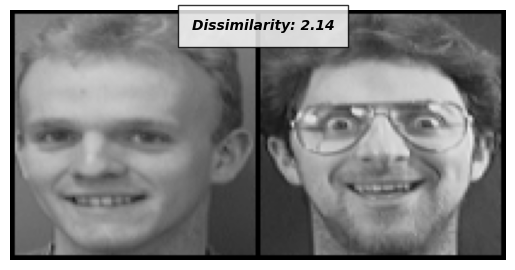

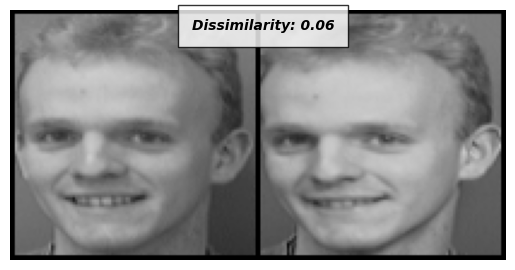

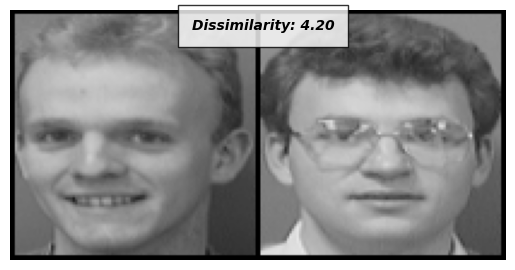

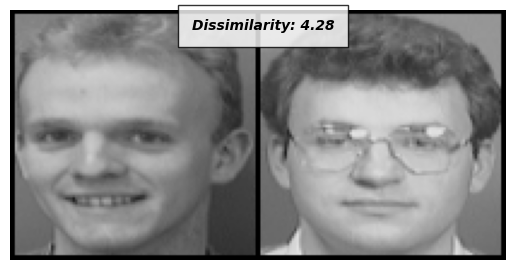

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

### Smaller

In [ ]:
class SiameseNetwork(nn.Module):

    def __init__(self):
        super(SiameseNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=11,stride=4),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(3, stride=2),

            nn.Conv2d(32, 64, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3,stride=1),
            nn.ReLU(inplace=True)
        )

        self.fc1 = nn.Sequential(
            nn.Linear(128, 256),
            nn.ReLU(inplace=True),

            nn.Linear(256, 128),
            nn.ReLU(inplace=True),

            nn.Linear(128,2)
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        # Funkcja przyjmuje obie próbki i zwraca parę wektorów
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)

        return output1, output2

In [ ]:
net = SiameseNetwork().to(device)
criterion = ContrastiveLoss()

loss_small = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

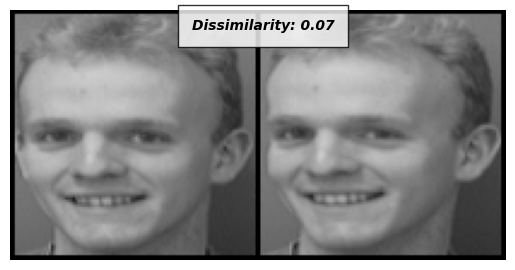

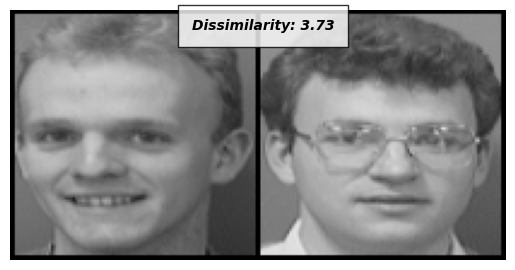

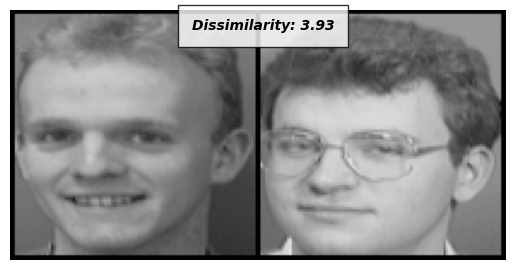

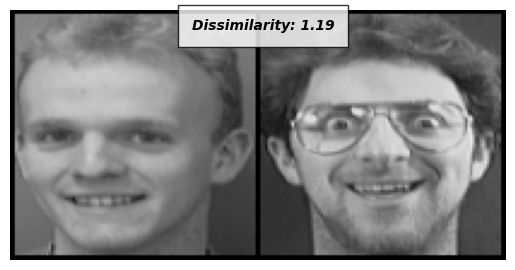

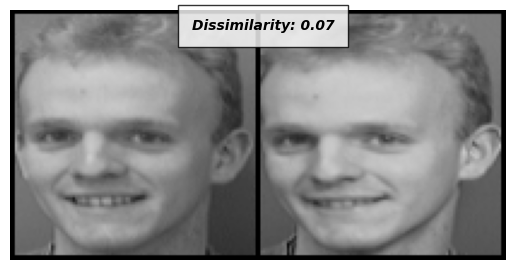

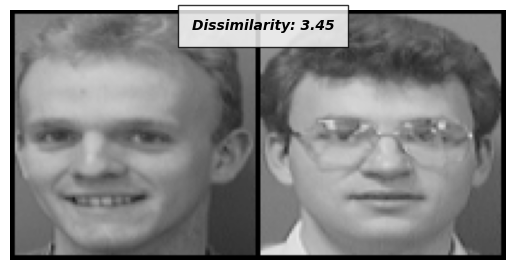

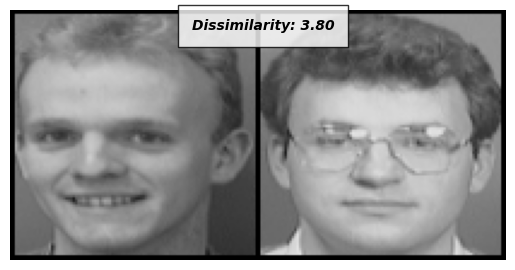

In [ ]:
for example_data in examples_data:
    x1 = example_data['x1']
    label2 = example_data['label2']

    concatenated = torch.cat((x0, x1), 0)

    output1, output2 = net(x0.to(device), x1.to(device))
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated), f'Dissimilarity: {euclidean_distance.item():.2f}')

In [ ]:
y_values = {
    'avgpool': loss_avgpool,
    'small': loss_small,
    'big': loss_big,
    'original': loss_lr_0005
}
df = pd.DataFrame(y_values)

fig = px.line(df, labels={'value': 'Loss', 'index': 'Epoch'},
              title='Diff Architectures', width=1000)

fig.show()

#Eksperymenty - Trójkowa sieć

In [ ]:
examples_data = []

for i in range(7):
    anchor, pos, neg = next(dataiter)

    example_data = {
        'anchor': anchor.clone(),
        'pos': pos.clone(),
        'neg': neg.clone(),

    }
    examples_data.append(example_data)

## Learning rate

### Lr=0.0005

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

loss_lr_0005 = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

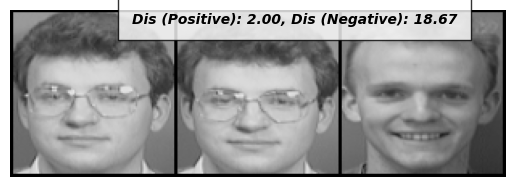

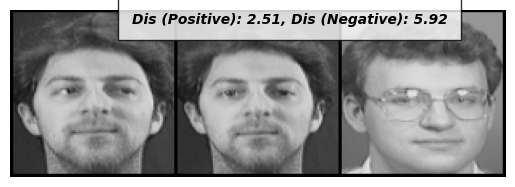

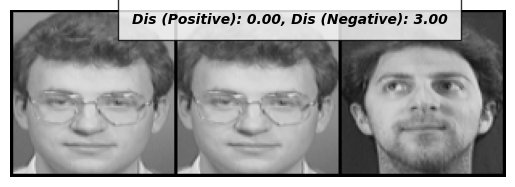

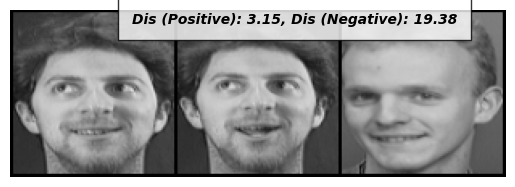

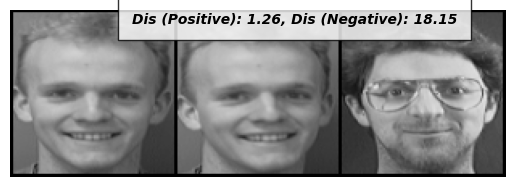

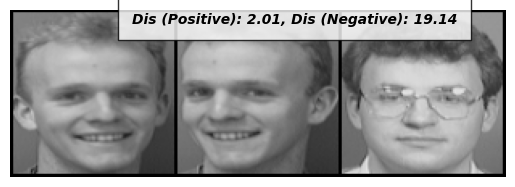

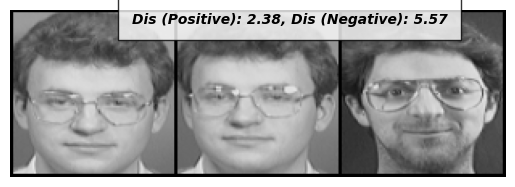

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

### Lr=0.005

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

loss_lr_005 = train(0.005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

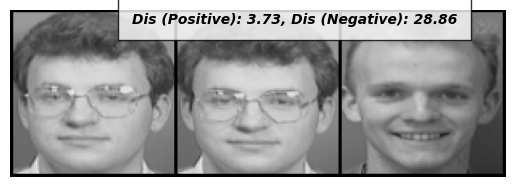

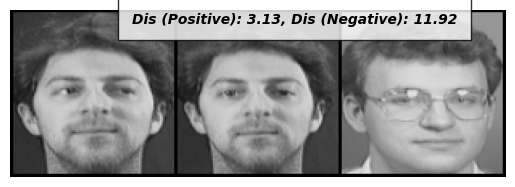

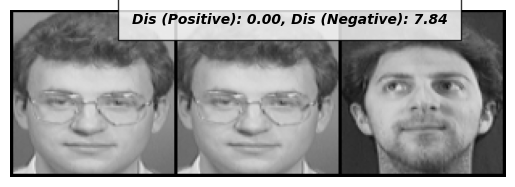

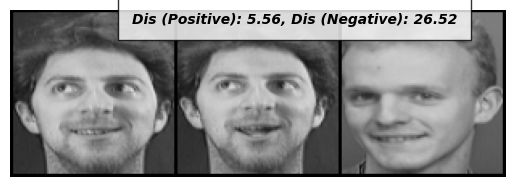

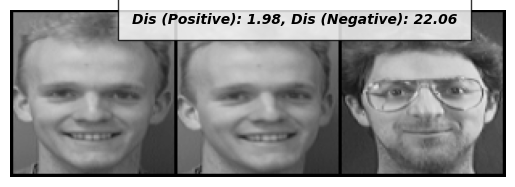

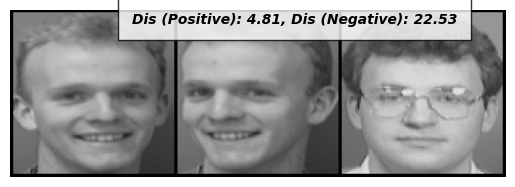

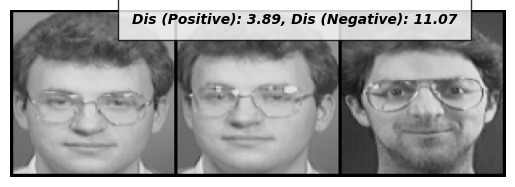

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

### Lr=0.00005

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

loss_lr_00005 = train(0.00005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

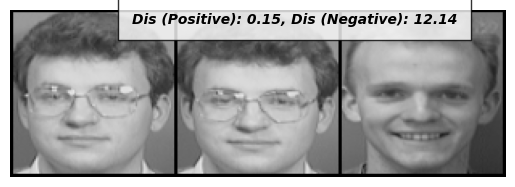

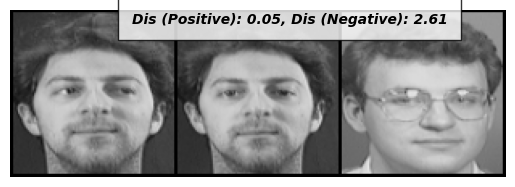

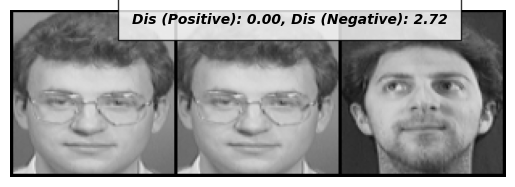

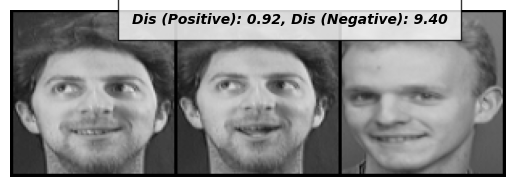

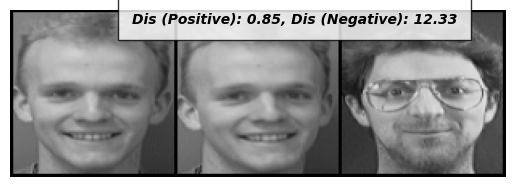

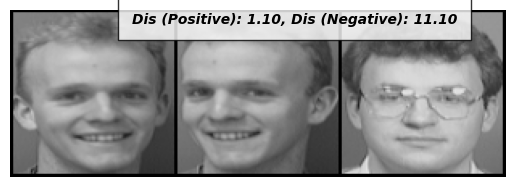

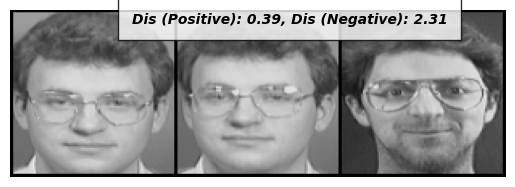

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

In [ ]:
y_values = {
    '0.005': loss_lr_005,
    '0.0005': loss_lr_0005,
    '0.00005': loss_lr_00005
}
df = pd.DataFrame(y_values)

fig = px.line(df, labels={'value': 'Loss', 'index': 'Epoch'},
              title='Learning rates (Triplets)')

fig.show()

## Epochs

### Epochs=50

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

ep = train(0.0005, 50)

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning:

This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



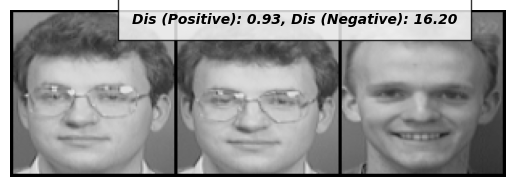

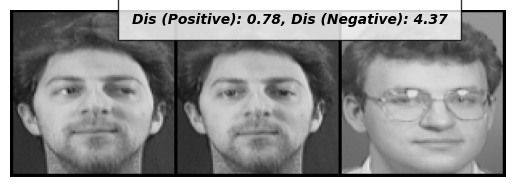

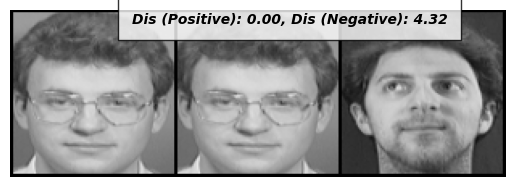

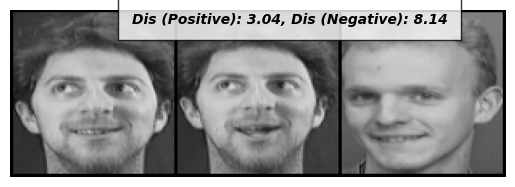

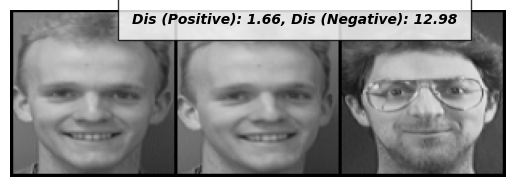

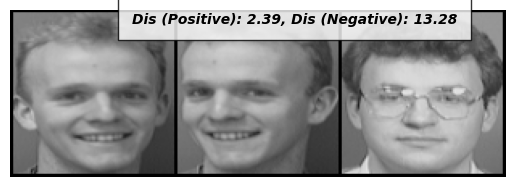

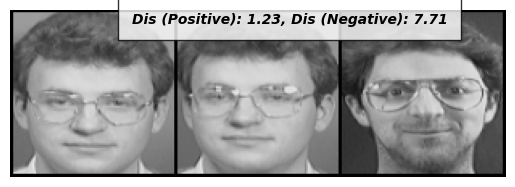

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

### Epochs=100

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

train(0.0005, 100)

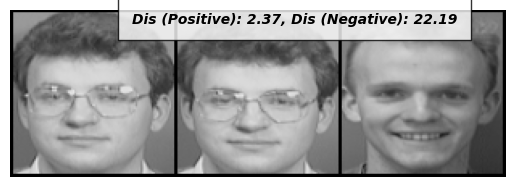

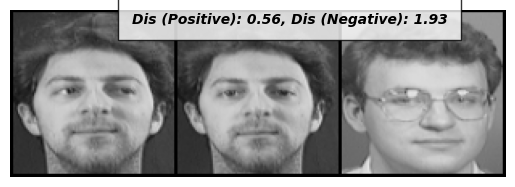

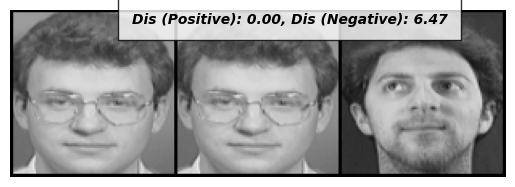

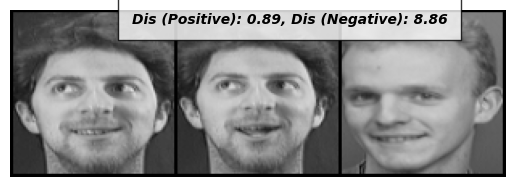

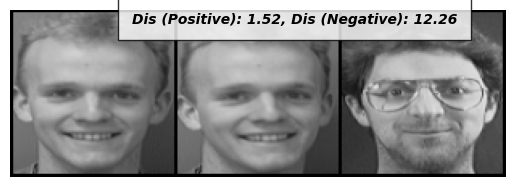

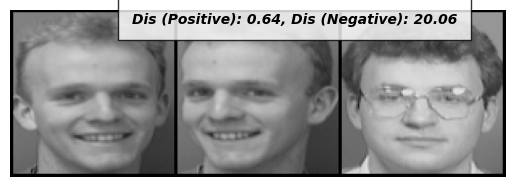

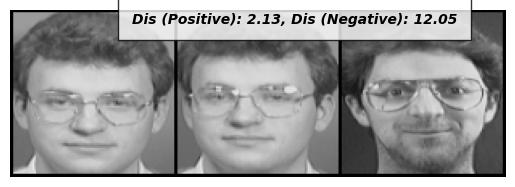

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

### Epochs=150

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

train(0.0005, 150)

  0%|          | 0/150 [00:00<?, ?it/s]

[1.8067110776901245,
 0.9703863263130188,
 1.3209385871887207,
 0.9815099239349365,
 0.7648493647575378,
 1.0970501899719238,
 0.7530427575111389,
 0.9804680347442627,
 0.646085262298584,
 0.7496368288993835,
 0.31747424602508545,
 0.5552265644073486,
 0.1870134472846985,
 0.433336466550827,
 0.23549386858940125,
 0.188546285033226,
 0.8157062530517578,
 0.2471468299627304,
 0.27035340666770935,
 0.45124849677085876,
 0.3149127960205078,
 0.25613707304000854,
 0.33510416746139526,
 0.2146506905555725,
 0.5008672475814819,
 0.2577480971813202,
 0.21851897239685059,
 0.2461635172367096,
 0.210094153881073,
 0.05317382514476776,
 0.16337265074253082,
 0.03886173292994499,
 0.023045074194669724,
 0.2178531289100647,
 0.006579432170838118,
 0.11486892402172089,
 0.2847665250301361,
 0.08287052065134048,
 0.17922843992710114,
 0.15886959433555603,
 0.26563718914985657,
 0.20521044731140137,
 0.11882764846086502,
 0.08477680385112762,
 0.19204147160053253,
 0.17400413751602173,
 0.17056502401

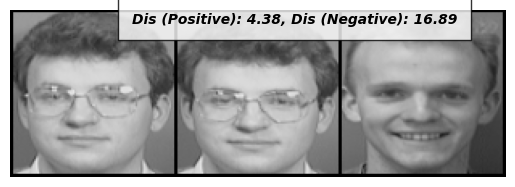

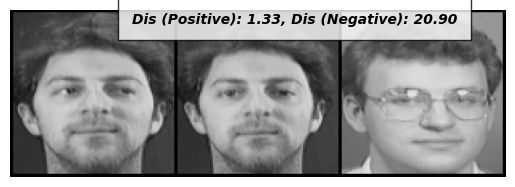

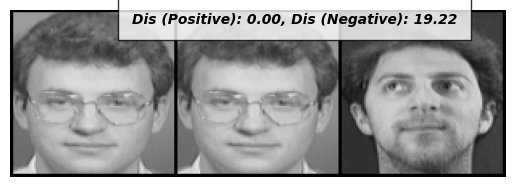

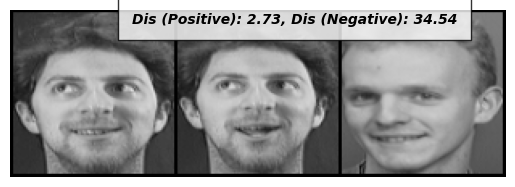

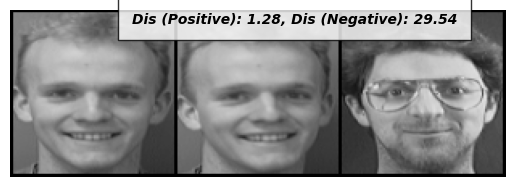

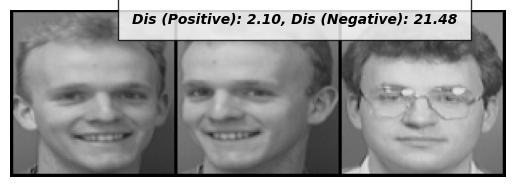

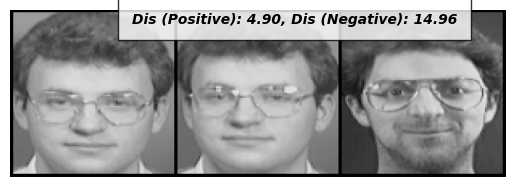

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

## Batch size

### Batch_s=32

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

loss_bs_32 = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

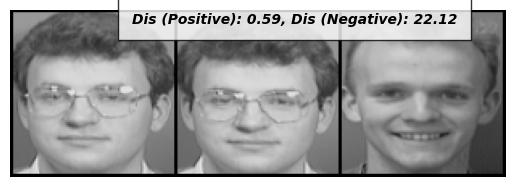

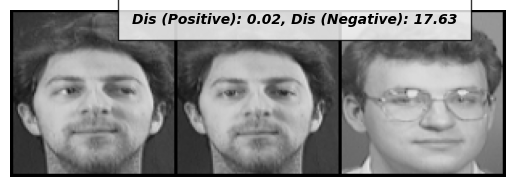

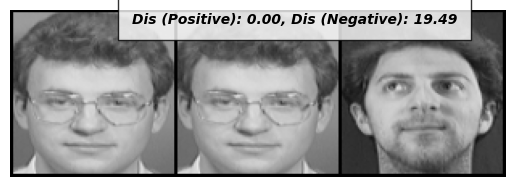

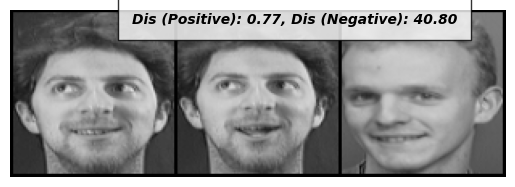

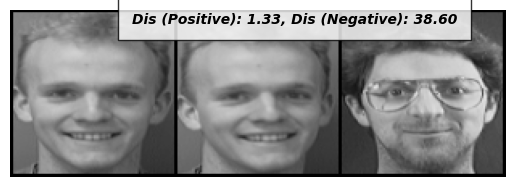

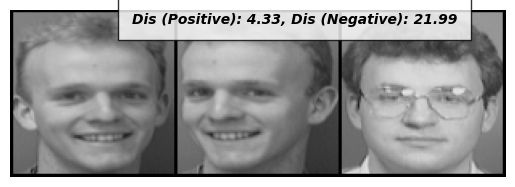

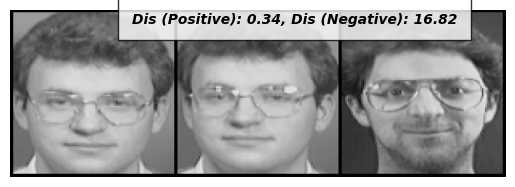

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

### Batch_s=64

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

loss_bs_64 = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

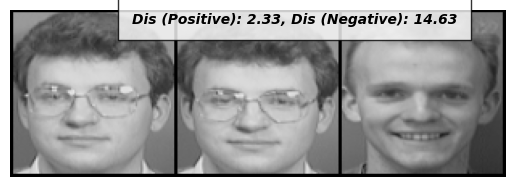

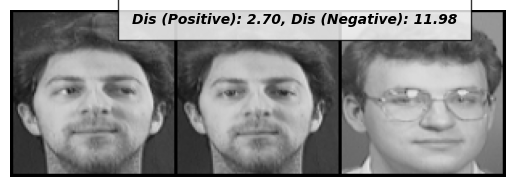

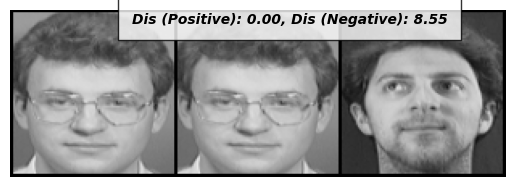

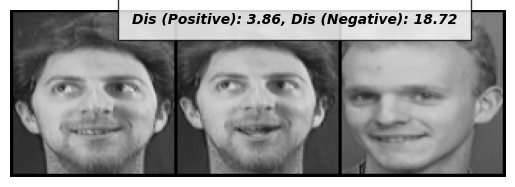

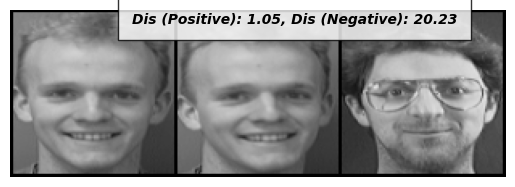

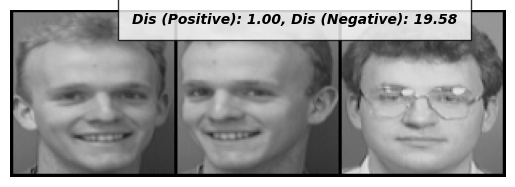

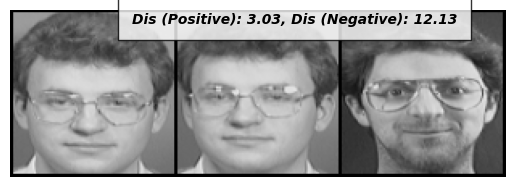

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

### Batch_s=128

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

loss_bs_128 = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

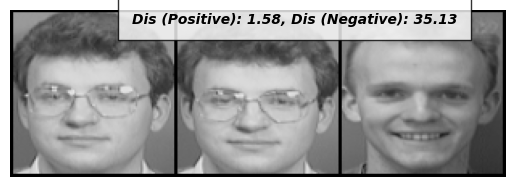

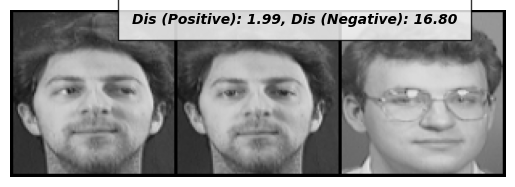

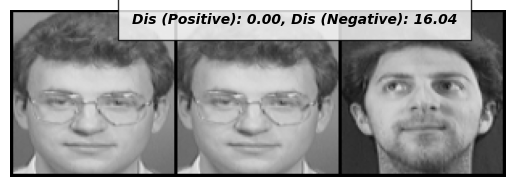

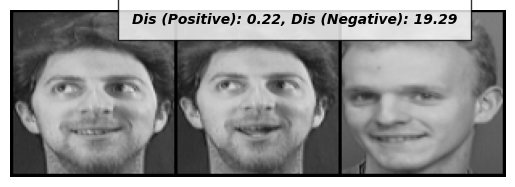

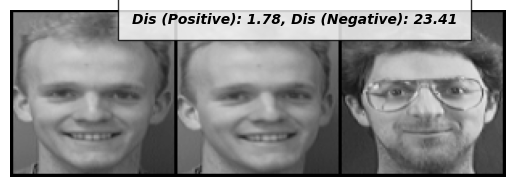

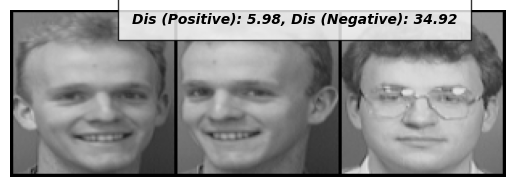

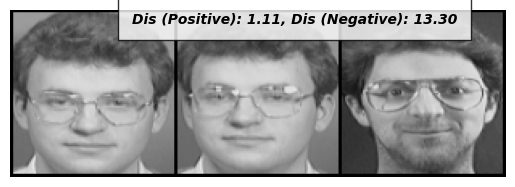

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

In [ ]:
y_values = {
    '32': loss_bs_32,
    '64': loss_bs_64,
    '128': loss_bs_128
}
df = pd.DataFrame(y_values)

fig = px.line(df, labels={'value': 'Loss', 'index': 'Epoch'},
              title='Batch Sizes')

fig.show()

##Inne architektury

### AvgPool

In [ ]:
def calculate_normal(input, kernel, stride, padding):
  return 1+ (input + 2*padding - (kernel-1) - 1)/stride

calculate_normal(100,11,4,0)

23.25

In [ ]:
class TripletSiameseNetwork(nn.Module):

    def __init__(self):
        super(TripletSiameseNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11,stride=4),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(3, stride=2),

            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(2, stride=2),

            nn.Conv2d(256, 384, kernel_size=3,stride=1),
            nn.ReLU(inplace=True)
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 1024),
            nn.ReLU(inplace=True),

            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),

            nn.Linear(256,2)
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2, input3):
        # Funkcja przyjmuje 3 próbki i zwraca 3 wektory
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        output3 = self.forward_once(input3)

        return output1, output2, output3

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

loss_avgpool = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning:

This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



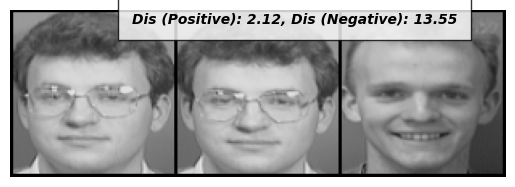

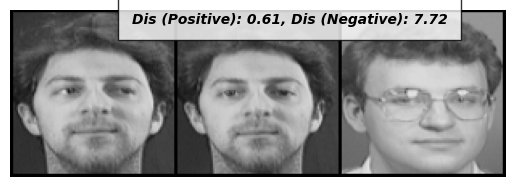

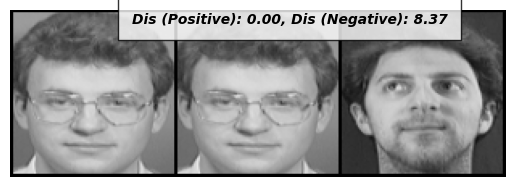

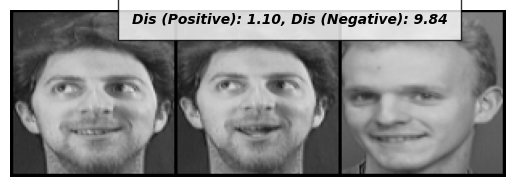

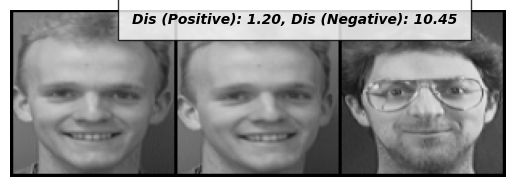

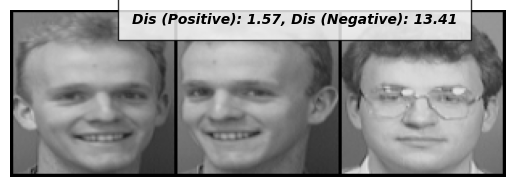

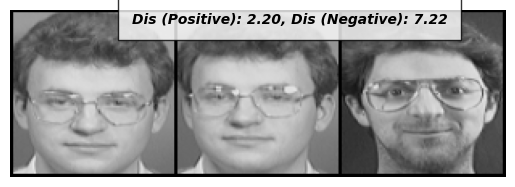

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

### Bigger

In [ ]:
def calculate_normal(input, kernel, stride, padding):
  return 1+ (input + 2*padding - (kernel-1) - 1)/stride

calculate_normal(100,3,1,1)

100.0

In [ ]:
class TripletSiameseNetwork(nn.Module):

    def __init__(self):
        super(TripletSiameseNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 96, kernel_size=11,stride=4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(3, stride=2),

            nn.Conv2d(96, 96, kernel_size=3,stride=1,padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(96, 256, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, stride=2),

            nn.Conv2d(256, 384, kernel_size=3,stride=1),
            nn.ReLU(inplace=True)
        )

        self.fc1 = nn.Sequential(
            nn.Linear(384, 1024),
            nn.ReLU(inplace=True),

            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),

            nn.Linear(256,2)
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2, input3):
        # Funkcja przyjmuje 3 próbki i zwraca 3 wektory
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        output3 = self.forward_once(input3)

        return output1, output2, output3

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

loss_big = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

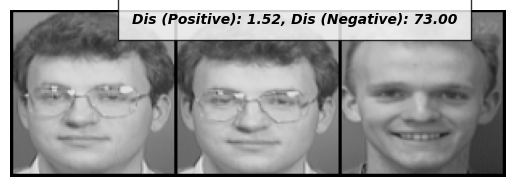

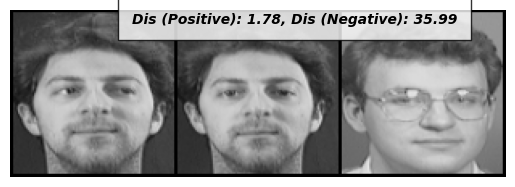

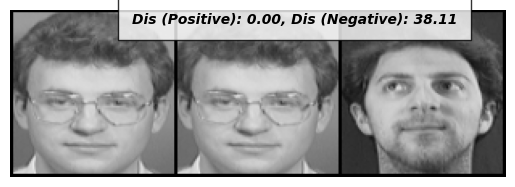

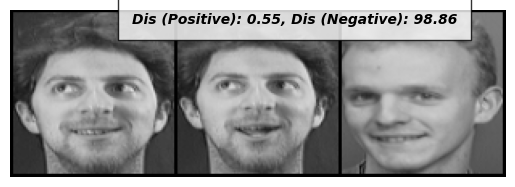

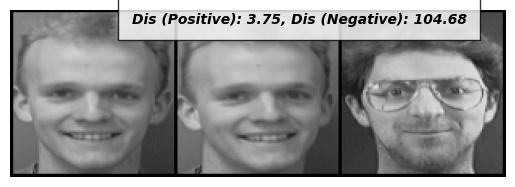

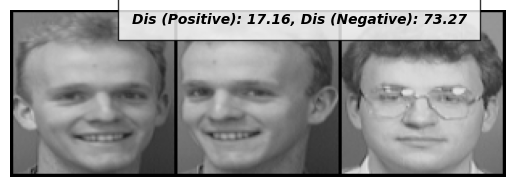

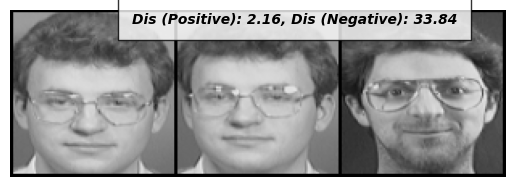

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

### Smaller

In [ ]:
class TripletSiameseNetwork(nn.Module):

    def __init__(self):
        super(TripletSiameseNetwork, self).__init__()

        self.cnn1 = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=11,stride=4),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(3, stride=2),

            nn.Conv2d(32, 64, kernel_size=5, stride=1),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3,stride=1),
            nn.ReLU(inplace=True)
        )

        self.fc1 = nn.Sequential(
            nn.Linear(128, 256),
            nn.ReLU(inplace=True),

            nn.Linear(256, 128),
            nn.ReLU(inplace=True),

            nn.Linear(128,2)
        )

    def forward_once(self, x):
        # Funkcja zostanie wywołana osobno dla każdej próbki
        # Jej wyjście zostanie wykorzystane w celu określenia odległości
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2, input3):
        # Funkcja przyjmuje 3 próbki i zwraca 3 wektory
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        output3 = self.forward_once(input3)

        return output1, output2, output3

In [ ]:
net = TripletSiameseNetwork().to(device)
criterion = TripletContrastiveLoss()

loss_small = train(0.0005, 100)

  0%|          | 0/100 [00:00<?, ?it/s]

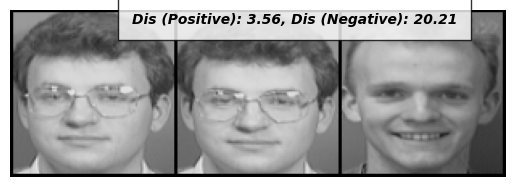

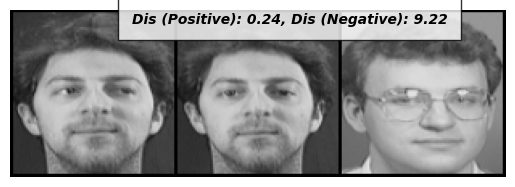

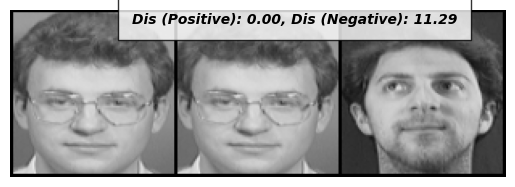

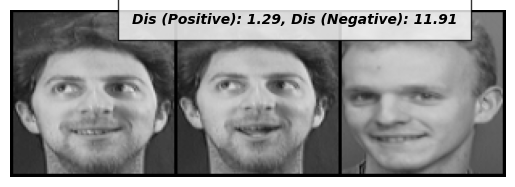

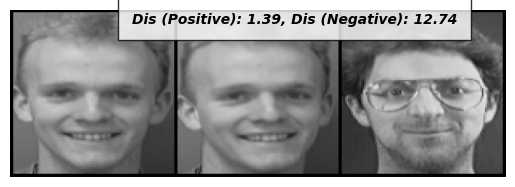

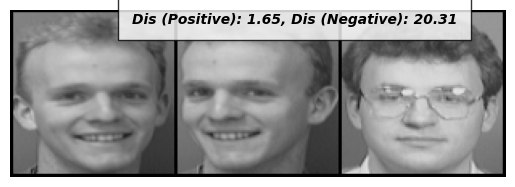

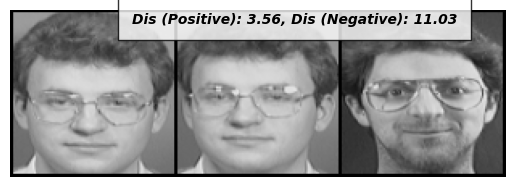

In [ ]:
for example_data in examples_data:

    anchor = example_data['anchor']
    pos = example_data['pos']
    neg = example_data['neg']

    output1, output2, output3 = net(anchor.to(device), pos.to(device), neg.to(device))

    dissimilarity_pos = F.pairwise_distance(output1, output2)
    dissimilarity_neg = F.pairwise_distance(output1, output3)

    concatenated = torch.cat((anchor, pos, neg), 0)

    imshow(torchvision.utils.make_grid(concatenated),
           f'Dis (Positive): {dissimilarity_pos.item():.2f}, Dis (Negative): {dissimilarity_neg.item():.2f}')

In [ ]:
y_values = {
    'avgpool': loss_avgpool,
    'small': loss_small,
    'big': loss_big
}
df = pd.DataFrame(y_values)

fig = px.line(df, labels={'value': 'Loss', 'index': 'Epoch'},
              title='Diff Architectures (Triplets)')

fig.show()